## Supervised Learning: Used car price prediction - Compare OLS and KNN model
-------------------------------------------
 
### Context: 
Craigslist is the world's largest collection of used vehicles for sale, yet it's very difficult to collect all of them in the same place. This dataset was downloaded from [Kaggle](https://www.kaggle.com/austinreese/craigslist-carstrucks-data) and was scraped from Craiglist, including every used vehicle entry within the United States for a period of time.

The dataset is scraped every few months, and contains most all relevant information that Craigslist provides on car sales including columns like price, condition, manufacturer, latitude/longitude, and 18 other categories. 

### Content:
This dataset includes 25 columns as below:
* **index**: the index of the vehicle
* **id**: unique identifier
* **url**: link to Craiglist site
* **region**: the region that the vehicle locates
* **region_url**: the link to the specific region
* **price**: listed price
* **year**: year of original purchase
* **manufacturer**: the make of the vehicle
* **model**: the model of the vehicle
* **condition**: the condition of the vehicle (new, excellent, like new, good, fair, salvage)
* **cylinders**: the number of cylinders
* **fuel**: the fuel type of the vehicle(gas, diesel, electric, hybrid, other)
* **odometer**: the milage on the vehicle
* **title_status**: the title status of the vehicle
* **transmission**: the transmission type
* **vin**: vin number associated with the vehicle
* **drive**: four-wheel-drive, front-wheel-drive or rear-wheel-drive
* **size**: the size of the vehicle
* **type**: the type of the vehicle
* **paintcolor**: the color og the vehicle
* **image_url**: images associated with the vehicle on Craiglist
* **description**: the description of the vehicle on Craiglist
* **county**: the county in which the vehicle locates
* **state**: the state in which the vehicle locates
* **lat**: the latitude
* **long**: the longitude

In this project, we'll clean and explore the dataset. Then we'll build and compare the result between OLS regression model and KNN model applied to the clean dataset.

Let's start with importing the dataset to our notebook!

### Import the dataset:

In [1]:
# Import libraries:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings

import statsmodels.api as sm
from statsmodels.tools.eval_measures import mse, rmse

from scipy.stats.mstats import winsorize

from sklearn.preprocessing import RobustScaler
from sklearn import neighbors
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV, ElasticNetCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, make_scorer

# Display preferences.
%matplotlib inline
pd.options.display.float_format = '{:.3f}'.format
warnings.filterwarnings('ignore')

# Edit pandas display option to show more rows and columns:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [2]:
# Import the dataset and inspect the shape of the data
df = pd.read_csv('vehicles.csv')
df.shape

(509577, 25)

As we can see, this dataset contain 509,577 rows and 25 columns. Since this is quite large and will take a lot of computational capacity, I will randomly sample for a smaller portion of the dataset for the ease of running this notebook.

In [3]:
# Randomly sample 200,000 rows from the original dataset:
used_cars = df.sample(n=200000, random_state=1234).reset_index()
print(used_cars.shape)

# Print out the first 5 rows of the new dataset:
used_cars.head()

(200000, 26)


,index,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,size,type,paint_color,image_url,description,county,state,lat,long
0,361138,7045202376,https://albuquerque.craigslist.org/ctd/d/albuq...,albuquerque,https://albuquerque.craigslist.org,164,2002.000,gmc,yukon,NaN,NaN,gas,241837.000,clean,automatic,1GKEK13Z02R159779,NaN,NaN,SUV,silver,https://images.craigslist.org/00F0F_2JlafBUW7R...,`Se Habla EspaÃ±ol` âï¸ð² Call or T...,nan,nm,35.087,-106.564
1,335396,7034395088,https://greensboro.craigslist.org/ctd/d/merced...,greensboro,https://greensboro.craigslist.org,0,2012.000,mercedes-benz,e-class,NaN,8 cylinders,gas,55525.000,clean,automatic,NaN,rwd,NaN,sedan,grey,https://images.craigslist.org/01010_8OfbCPPXjj...,Mercedes-Benz E-Class E 63 AMGÂ® Navigation He...,nan,nc,nan,nan
2,112106,7049418594,https://sacramento.craigslist.org/ctd/d/sacram...,sacramento,https://sacramento.craigslist.org,8998,2015.000,kia,soul ex,NaN,NaN,gas,84449.000,clean,automatic,KNDJP3A56F7164199,fwd,NaN,wagon,blue,https://images.craigslist.org/00e0e_YJpgyQDOJU...,"Asking Price: $8,998Contact Info:KM Auto Sale(...",nan,ca,38.624,-121.384
3,34922,7042597643,https://appleton.craigslist.org/ctd/d/eau-clai...,appleton-oshkosh-FDL,https://appleton.craigslist.org,21950,2016.000,bmw,x3 xdrive28i awd crossover,NaN,NaN,gas,42388.000,clean,automatic,5UXWX9C52G0D74980,NaN,NaN,NaN,NaN,https://images.craigslist.org/00y0y_8GSocZEC5e...,2016 BMW X3 xDrive28i AWD Crossover â We TA...,nan,wi,44.835,-91.516
4,332526,7033326208,https://fayetteville.craigslist.org/ctd/d/clay...,fayetteville,https://fayetteville.craigslist.org,0,2014.000,honda,accord,NaN,4 cylinders,gas,72211.000,clean,automatic,1HGCR2F89EA073995,fwd,NaN,sedan,NaN,https://images.craigslist.org/00U0U_b1NPvIcUvM...,ï»¿This 2014 Honda Accord EX-L has been SOLD b...,nan,nc,35.649,-78.469


From the first look, we can see that our dataset has url links, has vin numbers, has descriptions, has manufacturers, longitute and latitude of the vehicle location and so on. Some of the features will not become necessary for our model and will be eliminated later on. However, since this dataset has location identifiers, I'm just curious and want to see where all the used SUV for sale are located since I'm interested in purchasing an SUV. 

In [4]:
# Map all SUV on the map:
fig = px.scatter_mapbox(used_cars[used_cars['type']=='SUV'], lat='lat', lon='long', 
                        hover_name='price', hover_data=['manufacturer', 'year'],
                        color_continuous_scale=px.colors.cyclical.IceFire, zoom=3.2, height=500)
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

It looks like used SUV for sale scatter all over the U.S. However, most of them concentrate around the East Coast and very West Coast in bigger cities. 
Let's move to the next part, which is data cleaning and Exploratory data Analysis

### Data Cleaning and EDA

#### Imputing missind data

In [5]:
# Inspect the % of missing value per column
null = used_cars.isnull().sum()/len(used_cars)
null[null>0].sort_values()

description    0.000
image_url      0.000
year           0.003
title_status   0.006
transmission   0.007
fuel           0.008
model          0.016
lat            0.020
long           0.020
manufacturer   0.044
odometer       0.181
type           0.278
drive          0.283
paint_color    0.324
cylinders      0.391
vin            0.408
condition      0.454
size           0.670
county         1.000
dtype: float64

In [6]:
# Drop columns that are not neccessary for our analysis and columns that have more than 65% missing values.
# Since we don't need longitute and latitute features anymore, we'll drop them as well.
used_cars = used_cars.drop(['size', 'county', 'index', 'id', 'url', 'region_url', 'region', 
                            'vin', 'image_url', 'description', 'lat', 'long','model'], axis=1)

In [7]:
# Inspect the shape of our dataset after dropping columns:
used_cars.shape

(200000, 13)

In [8]:
used_cars.head()

,price,year,manufacturer,condition,cylinders,fuel,odometer,title_status,transmission,drive,type,paint_color,state
0,164,2002.000,gmc,NaN,NaN,gas,241837.000,clean,automatic,NaN,SUV,silver,nm
1,0,2012.000,mercedes-benz,NaN,8 cylinders,gas,55525.000,clean,automatic,rwd,sedan,grey,nc
2,8998,2015.000,kia,NaN,NaN,gas,84449.000,clean,automatic,fwd,wagon,blue,ca
3,21950,2016.000,bmw,NaN,NaN,gas,42388.000,clean,automatic,NaN,NaN,NaN,wi
4,0,2014.000,honda,NaN,4 cylinders,gas,72211.000,clean,automatic,fwd,sedan,NaN,nc


In [9]:
# Fill N/A of categorical variables with the most common value:
cols = ['condition', 'cylinders', 'paint_color', 'drive', 'type',  
        'manufacturer', 'fuel', 'transmission', 'title_status', 'year']

for col in cols:
    used_cars[col] = used_cars[col].fillna(used_cars[col].value_counts().index[0])

# Fill N/A of numerical variable with the mean value:
used_cars['odometer'] = used_cars['odometer'].fillna(used_cars['odometer'].mean())
used_cars['odometer'] = used_cars['odometer'].round()

In [10]:
# Double check to make sure there's no missing value left:
null = used_cars.isnull().sum()/len(used_cars)
null[null>0].sort_values()

Series([], dtype: float64)

In [11]:
# Inspect column datatype:
used_cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 13 columns):
price           200000 non-null int64
year            200000 non-null float64
manufacturer    200000 non-null object
condition       200000 non-null object
cylinders       200000 non-null object
fuel            200000 non-null object
odometer        200000 non-null float64
title_status    200000 non-null object
transmission    200000 non-null object
drive           200000 non-null object
type            200000 non-null object
paint_color     200000 non-null object
state           200000 non-null object
dtypes: float64(2), int64(1), object(10)
memory usage: 19.8+ MB


In [12]:
# Convert 'price' variable to float64:
used_cars['price'] = used_cars['price'].astype('float64')

#### Inspect numeric features

In [13]:
# First, let's take a look at numeric features:
used_cars.describe()

,price,year,odometer
count,200000.000,200000.000,200000.000
mean,27165.219,2009.675,101851.253
std,3955689.067,8.553,94612.952
min,0.000,1900.000,0.000
25%,3995.000,2007.000,61113.500
50%,9247.000,2011.000,101851.000
75%,17900.000,2015.000,128000.000
max,1316134912.000,2021.000,10000000.000


In [14]:
# Drop any row with year value = 2021 since it's the start of 2020:
used_cars.drop(used_cars[used_cars['year'] == 2021.000].index , inplace=True)

# Drop any row with price <300 since we're not trying to predict free cars:
used_cars.drop(used_cars[used_cars['price'] < 300.000].index , inplace=True)

In [15]:
used_cars.shape

(180472, 13)

#### Deal with outliners

Text(0.5, 1.0, 'boxplot of odometer variable')

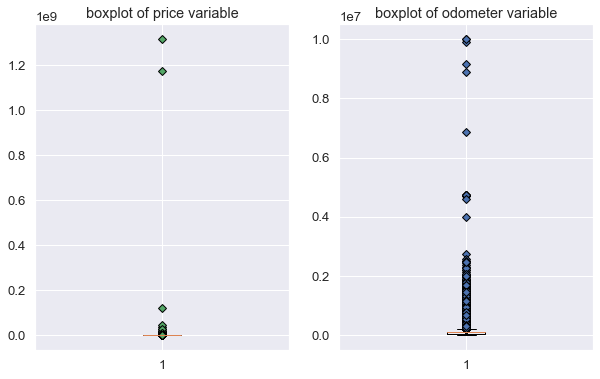

In [16]:
# Univariate and Bivariate analysis:
# Let's take a look at 'odometer' and 'price' variable:
plt.figure(figsize=(10,6))
sns.set(font_scale=1.2)

plt.subplot(1,2,1)
green_diamond = dict(markerfacecolor='g', marker='D')
plt.boxplot(used_cars['price'], flierprops=green_diamond)
plt.title('boxplot of price variable')

plt.subplot(1,2,2)
blue_diamond = dict(markerfacecolor='b', marker='D')
plt.boxplot(used_cars['odometer'], flierprops=blue_diamond)
plt.title('boxplot of odometer variable')

Wow, from the 2 boxplots above, we can see that both price and odometer features have some really big outliners that can potentially skew our dataset and statistics. We'll go ahead and eliminate them.

{'whiskers': [<matplotlib.lines.Line2D at 0x1c28405210>,
 'caps': [<matplotlib.lines.Line2D at 0x1c2eb4bb90>,
 'boxes': [<matplotlib.lines.Line2D at 0x1c284224d0>],
 'medians': [<matplotlib.lines.Line2D at 0x1c2da73610>],
 'fliers': [<matplotlib.lines.Line2D at 0x1c2da73b10>],
 'means': []}

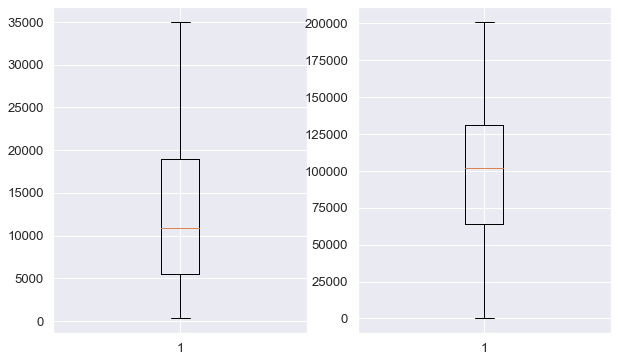

In [17]:
# Eliminate outliners using winsorization method at 95 percentile:
used_cars['price'] = winsorize(used_cars['price'], (0, 0.05))
used_cars['odometer'] = winsorize(used_cars['odometer'], (0, 0.05))

# Replot boxplots to detect any outliners left:
plt.figure(figsize=(10,6))
sns.set(font_scale=1.2)

plt.subplot(1,2,1)
green_diamond = dict(markerfacecolor='g', marker='D')
plt.boxplot(used_cars['price'], flierprops=green_diamond)

plt.subplot(1,2,2)
blue_diamond = dict(markerfacecolor='b', marker='D')
plt.boxplot(used_cars['odometer'], flierprops=blue_diamond)

As we can see, there's no outliners left after winsorization. Now let's take a look at the relationship between 'year', 'odometer' and our target variable('price')

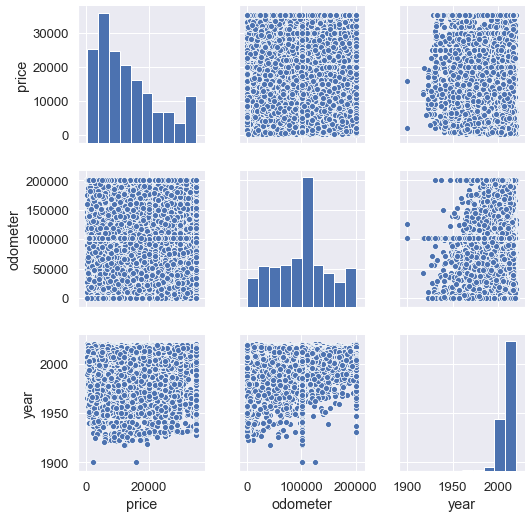

In [18]:
# Plot pairplot to show relationship:
sns.pairplot(used_cars[['price', 'odometer', 'year']])

In [19]:
# It's hard to see what's going on except for the fact that our variables are not nornally distributed.
# Let's look at the correlation between them.
corrmat = used_cars[['price', 'odometer', 'year']].corr()
corrmat

,price,odometer,year
price,1.000,-0.479,0.382
odometer,-0.479,1.000,-0.313
year,0.382,-0.313,1.000


Looking from the correlation matrix above, we can see that odometer has a negative relationship with price, which makes sense since the more mileage a car has, the lower they can sell for. Similarly, the newer the vehicle, the higher the price, as shown in the positive correlation between year and price variable.

#### Inspect categorical variables

In [20]:
# Let's take a look at categorical variables:
used_cars.describe(include='object')

,manufacturer,condition,cylinders,fuel,title_status,transmission,drive,type,paint_color,state
count,180472,180472,180472,180472,180472,180472,180472,180472,180472,180472
unique,42,6,8,5,6,3,3,13,12,51
top,ford,excellent,6 cylinders,gas,clean,automatic,4wd,sedan,white,ca
freq,40821,128810,109752,158396,172877,163260,111238,82871,88900,18656


In [21]:
# Let's inspect categorical variables to see which one requires further cleaning:
for i in used_cars.describe(include='object').columns:
    print(used_cars[i].value_counts())

ford               40821
chevrolet          25941
toyota             13684
ram                 9232
honda               9222
nissan              9068
jeep                8467
gmc                 8258
dodge               6561
bmw                 4934
mercedes-benz       4226
hyundai             4138
volkswagen          3765
subaru              3667
chrysler            3181
kia                 2958
cadillac            2631
lexus               2259
buick               2249
mazda               2047
audi                1986
acura               1488
infiniti            1371
pontiac             1333
lincoln             1186
volvo               1139
mitsubishi           974
mini                 797
saturn               675
mercury              671
rover                661
jaguar               376
fiat                 276
harley-davidson       66
tesla                 65
datsun                28
ferrari               26
alfa-romeo            25
land rover             8
aston-martin           6


All categorical variables make sense. Let's go ahead and encode our categorical variables:

#### Encoding and Feature Engineering

In [22]:
# Tranform 'cylinders' variable to only show the number of cylinders:
used_cars['cylinders'] = used_cars['cylinders'].apply(lambda x: x.replace(' cylinders',''))

# Replace 'other' cylinders with 0:
used_cars['cylinders'] = used_cars['cylinders'].apply(lambda x: x.replace('other','0'))
used_cars['cylinders'].unique()

# Convert 'cyclinders' variable to float64
used_cars['cylinders'] = used_cars['cylinders'].astype('int64')

In [23]:
# Convert 'condition' variable to numeric to address ranking of conditions:
used_cars['condition'] = used_cars['condition'].map({'salvage':0, 'fair':1, 'good':2, 
                                                     'like new':3, 'excellent':4, 'new':5})

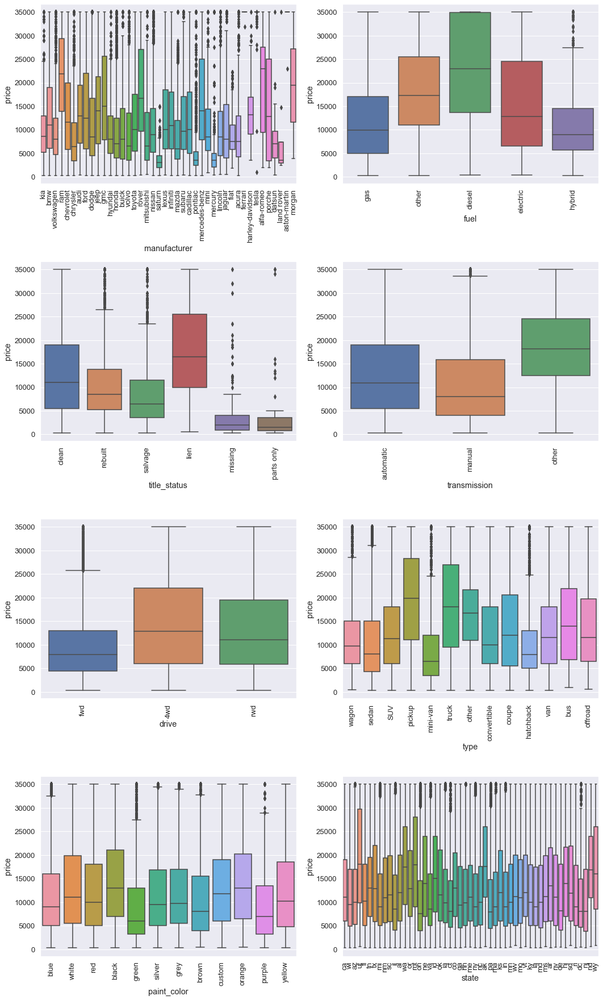

In [24]:
# Plot categorical variables against price to detect patterns:
object_cols = used_cars.select_dtypes(include = 'object').columns

fig = plt.figure(figsize=(15,30))
for i, col in enumerate(object_cols):
    fig.add_subplot(5,2,i+1)
    sns.boxplot(used_cars[col], used_cars['price'])
    plt.xticks(rotation=90)
    plt.xlabel(col)
    plt.ylabel('price')
fig.tight_layout()
fig.show()

Below are the observations from the boxplots that we created:
* On average, Ram and Alfa Romeo make have higher listed price than other makes.
* Diesel vehicles have the highest price out of all fuel types
* Lien status? What a surprise
* Trucks and pickup trucks are more expensive on average
* Black and orange are more expensive on average.

In [25]:
# Use label encoder to encode categorical variables:
from sklearn.preprocessing import LabelEncoder

lb_make = LabelEncoder()
cols = ['manufacturer', 'fuel', 'title_status', 'transmission', 'drive', 'type', 'paint_color', 'state']
for col in cols:
    used_cars[col] = lb_make.fit_transform(used_cars[col])
    
used_cars.head()

,price,year,manufacturer,condition,cylinders,fuel,odometer,title_status,transmission,drive,type,paint_color,state
2,8998.000,2015.000,21,4,6,2,84449.000,0,0,1,12,1,4
3,21950.000,2016.000,4,4,6,2,42388.000,0,0,0,9,10,48
5,12995.000,2016.000,40,4,4,2,45580.000,0,0,1,0,10,3
6,32995.000,2014.000,34,4,8,2,49512.000,0,0,0,8,8,44
7,10981.000,2014.000,7,4,6,2,101851.000,0,0,0,9,10,9


Now that we've got a clean dataset, let's take a look at the normality of our target variable - price. One of the assumption of linear regression is that the target variable is normally distributed, so let's try to transform our target variable to be as normally distributed as possible.

#### Normality and Transformation

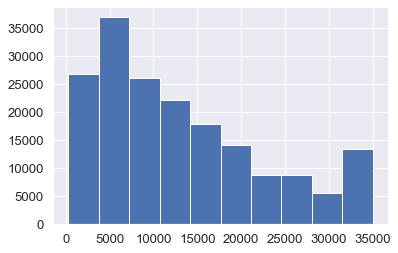

In [26]:
# Let's look at the distribution of price - our dependent variable:
used_cars['price'].hist()

Jarque-Bera test statistics is 16295.11762419256 and p value is 0.0
Normality test statistics is 13210.306585997616 and p value is 0.0


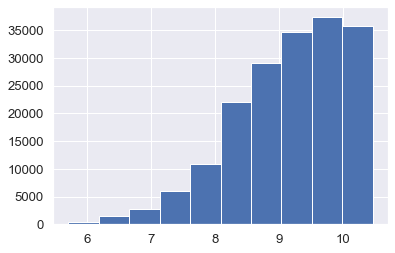

In [27]:
# Let's now use log transform price to make our variable more normally distributed
used_cars['price'] = np.log(used_cars['price'])

#Use jarque_bera and normaltest to test if our variables are normally distributed
from scipy.stats import jarque_bera
from scipy.stats import normaltest

jb_stats = jarque_bera(used_cars['price'])
norm_stats = normaltest(used_cars['price'])
print('Jarque-Bera test statistics is {0} and p value is {1}'.format(jb_stats[0], jb_stats[1]))
print('Normality test statistics is {0} and p value is {1}'.format(norm_stats[0], norm_stats[1]))

used_cars['price'].hist()

Even after we applied log transformation, our target variable is still not normally distributed. However, it get closer to a normal distribution than the original untransformed data. Now, let's build our model

### Building models:

In [28]:
# Create target variable and exploratory variables:
used_cars1 = used_cars.copy()
used_cars1 = used_cars1.drop(['price'], axis=1)

Y = used_cars['price'] # target variable
X = used_cars1 # explanatory variable

In [29]:
# Split the dataset into train and test set:
X_train, X_test, y_train, y_test = train_test_split(X, Y , test_size = 0.2, random_state=2468)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(144377, 12)
(144377,)
(36095, 12)
(36095,)


In [30]:
# Use RobustScaler to scale explanatory variables:
scaler= RobustScaler()
# transform 'X_train'
X_train = scaler.fit_transform(X_train)
# transform 'X_test'
X_test = scaler.transform(X_test)

#### Predicting used car price using OLS linear regression model

In [31]:
# Train the model on training set:
lrm = LinearRegression()
lrm.fit(X_train, y_train)

# We are making predictions here
y_preds_train = lrm.predict(X_train)
y_preds_test = lrm.predict(X_test)

print('R-squared of the model in training set is: {:.3f}'.format(lrm.score(X_train, y_train)))
print('-----Test set statistics-----')
print('R-squared of the model in test set is: {:.3f}'.format(lrm.score(X_test, y_test)))
print('MAE of the prediction is: {:.3f}'.format(mean_absolute_error(y_test, y_preds_test)))
print('MSE of the prediction is: {:.3f}'.format(mse(y_test, y_preds_test)))
print('RMSE of the prediction is: {:.3f}'.format(rmse(y_test, y_preds_test)))

R-squared of the model in training set is: 0.415
-----Test set statistics-----
R-squared of the model in test set is: 0.406
MAE of the prediction is: 0.486
MSE of the prediction is: 0.476
RMSE of the prediction is: 0.690


#### Predicting used car price using KNN model

In [32]:
rmse_val = [] #to store rmse values for different k
for K in range(10):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(X_train, y_train)  #fit the model
    pred=model.predict(X_test) #make prediction on test set
    error = math.sqrt(mean_squared_error(y_test,pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 0.6214856667570801
RMSE value for k=  2 is: 0.5676156288993846
RMSE value for k=  3 is: 0.5492579062047035
RMSE value for k=  4 is: 0.5386440261306998
RMSE value for k=  5 is: 0.5338518444507229
RMSE value for k=  6 is: 0.5301884155659429
RMSE value for k=  7 is: 0.5285571023093757
RMSE value for k=  8 is: 0.5276484392879244
RMSE value for k=  9 is: 0.5274454595542973
RMSE value for k=  10 is: 0.5281164346393655


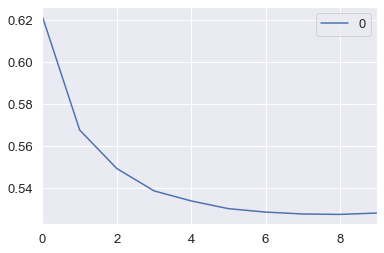

In [33]:
# Plotting the rmse values against k values
curve = pd.DataFrame(rmse_val) #elbow curve 
curve.plot() 

In [35]:
# Use GridSearch to find the best parameter for KNN model
from sklearn.model_selection import GridSearchCV

params = {'n_neighbors':[1,3,4,5,6,7,8]}

knn = neighbors.KNeighborsRegressor()

model = GridSearchCV(knn, params, cv=5)
model.fit(X_train,y_train)
model.best_params_

{'n_neighbors': 8}

Comparing between OLS regression and KNN model, we can see that KNN outperformed OLS and gave us a smaller error. Using k=8, which is the optimal k in our model, results in RMSE of 0.5276, smaller than the RMSE of OLS model at 0.69.